<a href="https://colab.research.google.com/github/CourtSingerr/MusicGenrePrediction/blob/main/MusicGenrePredictionReport.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predicting Music Genres from Audio Features Using Keras
##### Courtney Singer, November 2024


This project focuses on classifying music genres using the GTZAN dataset. A baseline CNN model is trained on three feature sets to identify which representation performs best. After selecting MFCC features based on initial results, hyperparameter tuning is employed to optimize the model’s architecture and parameters. The final tuned model is evaluated thoroughly, providing insights into which genres are easily distinguishable and highlighting areas where further improvements could be made.



---

# Step 1 Data Acquisition



### Data Overview

**Dataset:** DGTZAN Genre Collection

**Characteristics:**
- Total Samples: 1,000 audio tracks
- Each genre contains exactly 100 tracks
- Each audio track is approximately 30 seconds in duration
- Audio files are in .wav format, and stored in separate directories named after each genre.
-	Genres:
    - Blues
    - Classical
    - Country
    - Disco
    - Hip-hop
    - Jazz
    - Metal
    - Pop
    - Reggae
    - Rock


source: https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification


### Import Data

Data is being retrieved from a folder in my google drive. A copy of the data files also exists in the project GitHub repository.

In [ ]:
import librosa
import glob
import os

# Access Google drive
from google.colab import drive
drive.mount('/content/drive')

# Import files from each genre folder
base_dir = '/content/drive/My Drive/MusicData'
genres = os.listdir(base_dir)

for genre in genres:
    genre_path = os.path.join(base_dir, genre)
    wav_files = glob.glob(os.path.join(genre_path, '*.wav'))
    print(f"Processing {len(wav_files)} files in {genre}...")

    for file_path in wav_files:
        audio, sr = librosa.load(file_path, sr=None)

Mounted at /content/drive
Processing 100 files in blues...
Processing 100 files in classical...
Processing 100 files in country...
Processing 100 files in disco...
Processing 100 files in hiphop...
Processing 99 files in jazz...
Processing 100 files in metal...
Processing 100 files in pop...
Processing 100 files in reggae...
Processing 100 files in rock...
Processing 0 files in processed...
Processing 0 files in models...
Processing 0 files in processed_mfcc...
Processing 0 files in processed_final...
Processing 0 files in processed_segments...


---

# Step 2 - Identify Deep Learning Problem




**Problem Statement:**

This project aims to develop a convolution neural network to predict the genre of a music track using audio features. Given an audio clip or extracted audio features, the model should output a predicted genre from a predefined set (e.g., rock, jazz, classical, etc.).

This is a multi-class classification problem of music genres from audio tracks, using convolutional neural networks.

**Metrics and Evaluation Criteria:**
-  Accuracy will be the primary metric since this is a classification problem
- Confusion matrix and F1-scores for each genre class will be used to further examine performance.

**Expirement Setup**
- Data split: 70% training, 15% validation, 15% test
- Encode labels using one-hot encoding
- Various representions of the data will be compared to determine the most effective for classification
  - Log-Mel Spectrograms
  - MFCC (Mel-Frequency Cepstral Coefficients)
  - MFCC with Delta and Delta-Delta Features


**Required Packages:**

In [ ]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 3.0 MB/s eta 0:00:00


In [ ]:
import os
import glob
import json
import random
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Audio, display
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, f1_score, confusion_matrix
import tensorflow as tf
import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.utils import to_categorical



---

# Step 3 - EDA

Before building and training the model, it’s important to understand the dataset thoroughly. This step reveals issues like missing data or imbalances, clarifies feature distributions and relationships, and guides preprocessing and feature selection.


The steps I took during Exploratory Data Analysis include:
1. EDA on raw data
    - Data integrity checks
    - Qualitative Inspection (Listening and Waveform Analysis)
    - Basic Audio Statistics (Duration and RMS Energy)
    - Preliminary Feature Extraction for Inspection (e.g., Mel-Spectrograms)
    - Distribution and Correlation of Feature Statistics
    - Checking for Outliers:

2. Data splitting
  - Segment Data to increase size of training data
  - Use 70/15/15 split for train/val/test

3. Feature Extraction and Preprocessing
  - Extract features
  - Normalization
  - One-Hot Encoding of Labels
  - Reshape data for CNN

4. EDA on Processed features
  - Verify Normalization
  - Check class balance
  - Dimensionality reduction
  - Check for outliers

## 1. EDA on Raw data


**Data Integrity Checks**

This step verifies that each genre folder contains the expected number of valid audio files and identifies any corrupt ones. Ensuring consistent file counts and formats helps prevent errors later in the modelling process.

** During import, one corrupt file was found in the jazz folder and removed, so we expect only 99 jazz files. While this is a minor imbalance, the dataset remains largely uniform, ensuring that no major data integrity issues should interfere with model training.


In [ ]:
genre_file_counts = {}
for genre in genres:
    genre_path = os.path.join(base_dir, genre)
    wav_files = glob.glob(os.path.join(genre_path, '*.wav'))
    genre_file_counts[genre] = len(wav_files)

print("File counts per genre:")
for g, count in genre_file_counts.items():
    print(f"{g}: {count}")

min_count = min(genre_file_counts.values())
max_count = max(genre_file_counts.values())
if min_count != max_count:
    print("Warning: Class imbalance detected.")

File counts per genre:
blues: 100
classical: 100
country: 100
disco: 100
hiphop: 100
jazz: 99
metal: 100
pop: 100
reggae: 100
rock: 100
processed: 0
models: 0
processed_mfcc: 0
processed_final: 0
processed_segments: 0


**Listening to Samples and Waveform Inspection**

By listening to random audio samples and visualizing their waveforms, we confirm that the data loads correctly and has no obvious quality issues. This qualitative check gives an initial sense of how tracks from different genres vary in sound.

I have randomly selected one file from each genre to listen to, and a second to view its waveform.



In [ ]:
# Listen to one random file from each genre
for genre in genres:
    genre_path = os.path.join(base_dir, genre)
    wav_files = glob.glob(os.path.join(genre_path, '*.wav'))
    if len(wav_files) > 0:
        sample_file = random.choice(wav_files)
        print(f"Playing a sample from {genre}: {os.path.basename(sample_file)}")
        display(Audio(sample_file))

Playing a sample from blues: blues.00089.wav


Playing a sample from classical: classical.00021.wav


Playing a sample from country: country.00058.wav


Playing a sample from disco: disco.00007.wav


Playing a sample from hiphop: hiphop.00051.wav


Playing a sample from jazz: jazz.00078.wav


Playing a sample from metal: metal.00063.wav


Playing a sample from pop: pop.00003.wav


Playing a sample from reggae: reggae.00036.wav


Playing a sample from rock: rock.00063.wav


The samples played without issue, confirming that the files load correctly and contain actual music data rather than silence or noise.

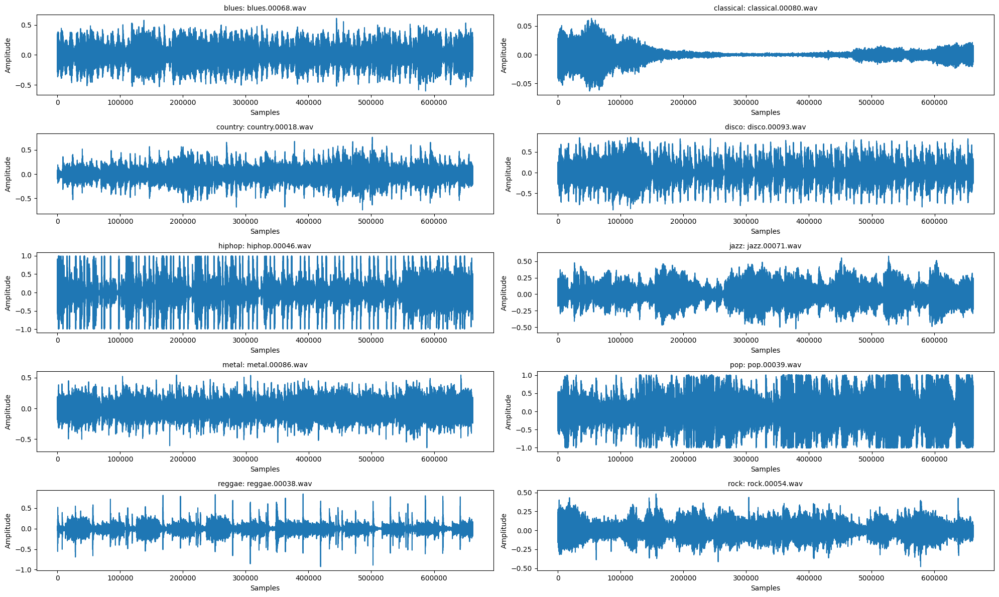

In [ ]:
def plot_waveforms_in_grid(genres, base_dir):
    # Create a 2x5 grid of subplots
    fig, axs = plt.subplots(5, 2, figsize=(20, 12))
    axs = axs.flatten()  # Flatten to easily iterate over 10 axes

    # Plot one waveform from each of the first 10 genres
    for i, genre in enumerate(genres[:10]):
        wav_files = glob.glob(os.path.join(base_dir, genre, '*.wav'))
        sample_file = random.choice(wav_files)

        # Load audio
        y, sr = librosa.load(sample_file, sr=None)

        # Plot on the corresponding subplot
        axs[i].plot(y)
        axs[i].set_title(f"{genre}: {os.path.basename(sample_file)}", fontsize=10)
        axs[i].set_xlabel('Samples')
        axs[i].set_ylabel('Amplitude')

    # Adjust layout so titles/labels don't overlap
    plt.tight_layout()
    plt.show()

# Call the function
plot_waveforms_in_grid(genres, base_dir)

The waveform plots showed distinct amplitude patterns across genres, suggesting that even raw audio signals contain genre-specific characteristics.

**Basic Audio Statistics**

Examining simple metrics like track duration and RMS energy provides a quick way to ensure consistency and spot significant anomalies. If one genre’s tracks differ notably in length or loudness, it may affect the training process or indicate a data issue.

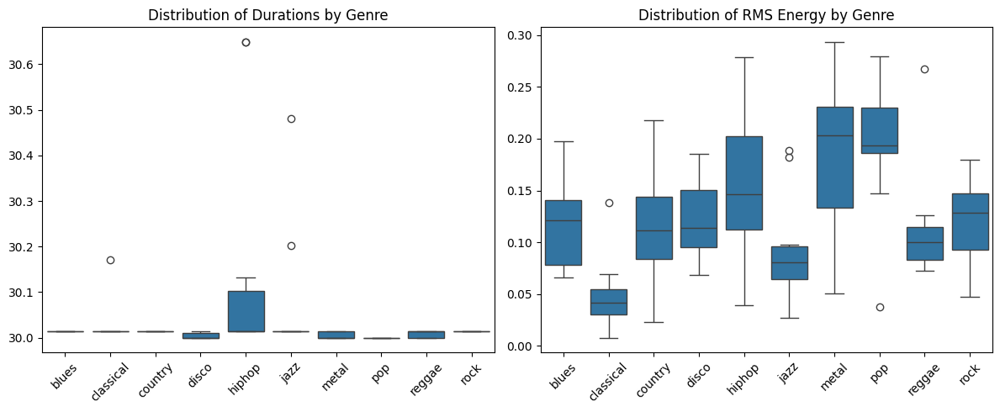

In [ ]:
durations = []
rms_values = []
labels = []

for genre in genres:
    wav_files = glob.glob(os.path.join(base_dir, genre, '*.wav'))
    for f in random.sample(wav_files, min(10, len(wav_files))):  # Sample only 10 files per genre
        y, sr = librosa.load(f, sr=None)
        dur = len(y) / sr
        durations.append(dur)
        labels.append(genre)

        # Compute RMS energy
        rms = librosa.feature.rms(y=y).mean()
        rms_values.append(rms)

durations = np.array(durations)
rms_values = np.array(rms_values)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.boxplot(x=labels, y=durations)
plt.title('Distribution of Durations by Genre')
plt.xticks(rotation=45)

plt.subplot(1,2,2)
sns.boxplot(x=labels, y=rms_values)
plt.title('Distribution of RMS Energy by Genre')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The audio durations were generally consistent around 30 seconds, which is ideal for standardized feature extraction. RMS energy varied among genres, implying differences in loudness or intensity patterns that could serve as useful indicators for genre classification.


**Preliminary Feature Extraction for Inspection**

Computing features like Mel-spectrograms and plotting them offers an early look at frequency and time-domain patterns within each genre. This visual exploration helps confirm that selected features capture meaningful distinctions in the audio data.

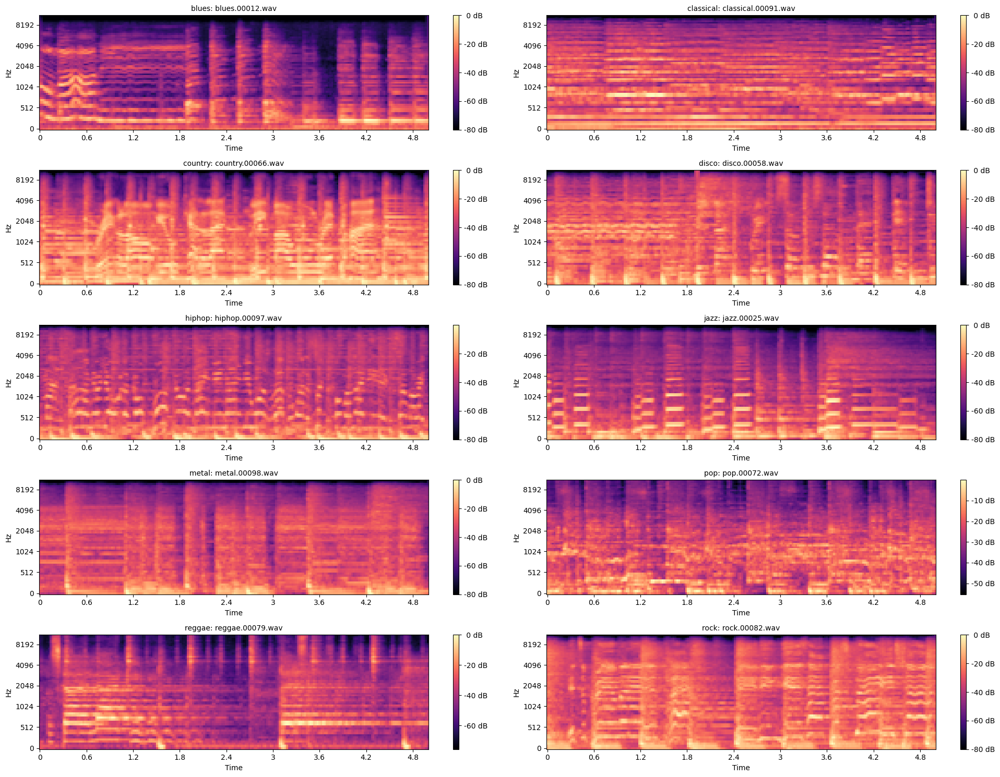

In [ ]:
def extract_mel_spectrogram(file_path, sr=22050, n_mels=64, duration=5):
    y, sr = librosa.load(file_path, sr=sr, duration=duration)
    # Pad if needed
    if len(y) < sr * duration:
        y = np.pad(y, (0, sr*duration - len(y)), mode='constant')
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels)
    S_db = librosa.power_to_db(S, ref=np.max)
    return S_db

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(20, 15))
max_plots = 10

for i, genre in enumerate(genres[:max_plots]):
    wav_files = glob.glob(os.path.join(base_dir, genre, '*.wav'))
    if len(wav_files) > 0:
        sample_file = random.choice(wav_files)
        S_db = extract_mel_spectrogram(sample_file)
        row = i // 2
        col = i % 2

        ax = axes[row][col]
        img = librosa.display.specshow(S_db, x_axis='time', y_axis='mel', sr=22050, ax=ax)
        ax.set_title(f"{genre}: {os.path.basename(sample_file)}", fontsize=10)
        fig.colorbar(img, ax=ax, format='%2.0f dB')

plt.tight_layout()
plt.show()

Visualizing Mel-spectrograms revealed distinct frequency distributions and patterns across genres. This suggests that spectral features should be informative and that frequency-based attributes could help differentiate genres in the classification model.

**Distribution and Correlation of Feature Statistics**

Assessing how feature statistics (e.g., mean energy in certain frequency bands) vary by genre reveals which features might be useful for classification. Checking correlations among features can guide decisions about reducing redundant data before training.



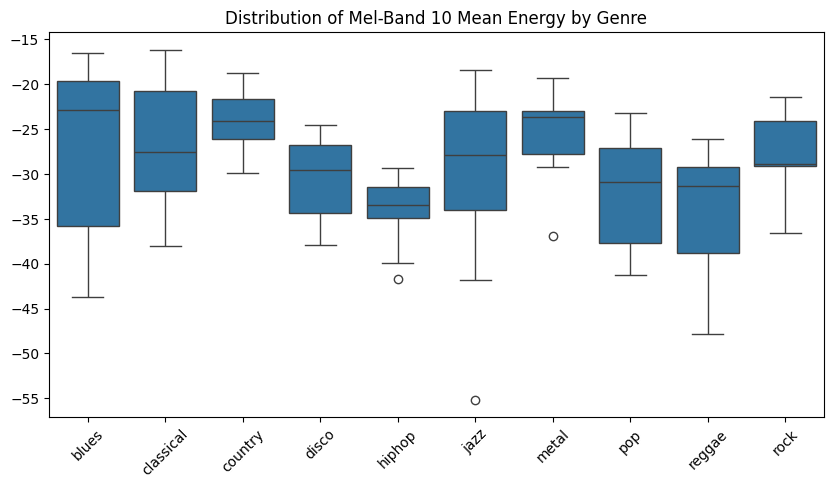

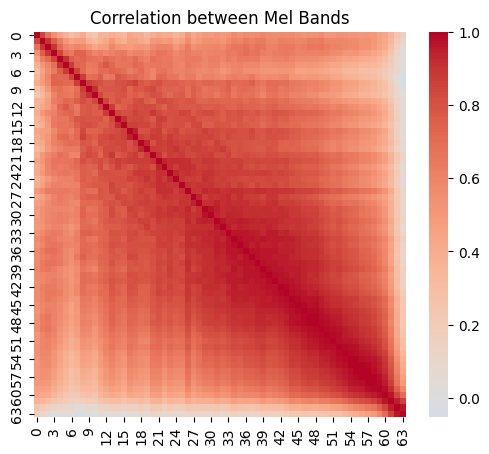

In [ ]:
# Extract features for a small subset of files to do a statistical analysis
X_feats = []
Y_labels = []
for genre in genres:
    wav_files = glob.glob(os.path.join(base_dir, genre, '*.wav'))
    for f in random.sample(wav_files, min(10, len(wav_files))):
        S_db = extract_mel_spectrogram(f)
        # Compute mean across time to get a single vector
        mean_feat = S_db.mean(axis=1)  # shape = (n_mels,)
        X_feats.append(mean_feat)
        Y_labels.append(genre)

X_feats = np.array(X_feats)
# Plot distribution of one mel-band across genres
mel_band = 10  # arbitrary choice
plt.figure(figsize=(10,5))
sns.boxplot(x=Y_labels, y=X_feats[:, mel_band])
plt.title(f"Distribution of Mel-Band {mel_band} Mean Energy by Genre")
plt.xticks(rotation=45)
plt.show()

# Correlation of Mel-band means
corr = np.corrcoef(X_feats.T)
plt.figure(figsize=(6,5))
sns.heatmap(corr, cmap='coolwarm', center=0)
plt.title("Correlation between Mel Bands")
plt.show()

Genres displayed varying distributions of mean energy across specific Mel frequency bands, indicating that certain frequency ranges might be more characteristic of specific genres. Some features were correlated, suggesting that reducing feature redundancy could enhance model efficiency and clarity.


**Checking for Outliers**

Identifying extreme outliers, for example using z-scores on RMS energy, helps detect unusual samples that could skew model performance. Removing or handling these outliers ensures a more balanced and representative dataset for learning.


In [ ]:
# Use z-score on RMS values as a simple outlier detection
rms_z = zscore(rms_values)
outlier_threshold = 3
outliers = np.where(np.abs(rms_z) > outlier_threshold)[0]
print("Outliers indices:", outliers)

Outliers indices: []


---

## 2. Data Splitting

This section involves two parts.

1.	Segmenting the Audio
  - Each 30-second audio track is subdivided into shorter segments (10-second clips) to effectively increase the training data.
  - All segments, along with their genre labels, are combined and then randomly shuffled.


2. Splitting into Train/Validation/Test Sets:
  - Dataset is divided into three subsets using a  70/15/15 split for train/val/test.
  - Each genre’s segments are proportionally split into these sets, ensuring that the class distribution remains consistent across train, validation, and test splits.



**Segmenting the Audio**

In [ ]:
## Segment the data

processed_segments_dir = os.path.join(base_dir, "processed_segments")
os.makedirs(processed_segments_dir, exist_ok=True)

# Audio and feature extraction parameters
sr = 22050
total_duration = 30.0
desired_segment_length = 6.0
samples_per_segment = int(sr * desired_segment_length)
total_samples = int(sr * total_duration)
num_segments = total_samples // samples_per_segment


all_segments = []
for genre in genres:
    genre_path = os.path.join(base_dir, genre)
    wav_files = glob.glob(os.path.join(genre_path, '*.wav'))

    for f in wav_files:
        y, _ = librosa.load(f, sr=sr, duration=total_duration, mono=True)

        if len(y) < total_samples:
            y = np.pad(y, (0, total_samples - len(y)), mode='constant')

        for i in range(num_segments):
            start = i * samples_per_segment
            end = start + samples_per_segment
            segment = y[start:end]

            file_id = os.path.splitext(os.path.basename(f))[0]
            seg_filename = f"{file_id}_seg{i}.npy"
            seg_path = os.path.join(processed_segments_dir, seg_filename)
            np.save(seg_path, segment)

            all_segments.append((seg_path, genre))

**Splitting the Data**

In [ ]:
## Shuffle and split data into train/val/test sets
# Define ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15


random.seed(101)
random.shuffle(all_segments)

train_files = []
val_files = []
test_files = []

for genre in genres:
    genre_segments = [(fp, g) for fp, g in all_segments if g == genre]
    random.shuffle(genre_segments)
    n_total = len(genre_segments)
    n_train = int(n_total * train_ratio)
    n_val = int(n_total * val_ratio)

    train_files.extend(genre_segments[:n_train])
    val_files.extend(genre_segments[n_train:n_train+n_val])
    test_files.extend(genre_segments[n_train+n_val:])

print(f"Train: {len(train_files)}, Val: {len(val_files)}, Test: {len(test_files)}")

# Now you have train_files, val_files, and test_files that refer to segment-level feature files.
# These can be loaded and fed into your model training pipeline.

Train: 3496, Val: 749, Test: 750


---

## Feature Extraction and Preprocessing

This section focuses on transforming the raw audio segments into a suitable input format for a convolutional neural network.

There are different methods for extracting features from audio files. In this analysis, I look at three methods, comparing the accuracy of each during model training.

The three methods used are
1.	Log-Mel Spectrograms:
  - Convert raw audio into a time-frequency representation.
  - Use the mel scale to approximate human auditory perception of pitch.
  - Apply a logarithmic transformation to highlight important spectral variations.

2.	MFCC (Mel-Frequency Cepstral Coefficients):
  - Extract features that summarize the spectral envelope of short-term frames.
  - Model sound frequency content along a mel scale to reflect human hearing more closely.
  - Often used in speech recognition and music classification due to their robust representation of timbral qualities.

3.	MFCC with Delta and Delta-Delta Features:
  -	Extend base MFCCs with first and second derivatives (deltas and delta-deltas).
  - Capture temporal changes in the spectral features to reflect dynamic aspects of the audio.
  - Provide richer contextual information, potentially improving genre classification performance.

**Define Feature Extraction**

  In this step, functions are written to compute the different audio representations from the raw waveform segments (e.g., log-mel spectrograms, MFCCs, MFCCs with delta and delta-delta features).

  These transformations turn the raw audio signal into feature-rich, two-dimensional arrays that better capture time-frequency patterns important for genre classification.

In [ ]:
# Modify this if needed. Assuming these are your desired parameters.
sr = 22050
n_mels = 128
n_fft = 2048
hop_length = 512
n_mfcc = 40  # for MFCC


genre_to_idx = {genre: i for i, genre in enumerate(genres)}

def extract_log_mel_spectrogram_from_npy(npy_path, sr=22050, n_mels=128, n_fft=2048, hop_length=512):
    y = np.load(npy_path)
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels, n_fft=n_fft, hop_length=hop_length)
    S_db = librosa.power_to_db(S, ref=np.max)
    return S_db

def extract_mfcc_from_npy(npy_path, sr=22050, n_mfcc=20, n_fft=2048, hop_length=512):
    y = np.load(npy_path)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)
    return mfcc

def extract_mfcc_with_deltas_from_npy(npy_path, sr=22050, n_mfcc=20, n_fft=2048, hop_length=512):
    y = np.load(npy_path)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)
    mfcc_delta = librosa.feature.delta(mfcc)
    mfcc_delta2 = librosa.feature.delta(mfcc, order=2)
    mfcc_combined = np.concatenate([mfcc, mfcc_delta, mfcc_delta2], axis=0)
    return mfcc_combined

**Extract Features for Each Split**

  Using the defined extraction methods, the raw audio segments from each subset (training, validation, and test) are processed to generate feature matrices. This ensures that each split has the same type of data representation, enabling fair comparison and model evaluation across different sets.

In [ ]:
def process_files(file_list, genre_to_idx, method='log_mel'):
    X = []
    Y = []
    for (fp, g) in file_list:
        if method == 'log_mel':
            features = extract_log_mel_spectrogram_from_npy(fp, sr=sr, n_mels=n_mels, n_fft=n_fft, hop_length=hop_length)
        elif method == 'mfcc':
            features = extract_mfcc_from_npy(fp, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)
        elif method == 'mfcc_deltas':
            features = extract_mfcc_with_deltas_from_npy(fp, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)
        else:
            raise ValueError("Unknown feature extraction method.")

        X.append(features)
        Y.append(genre_to_idx[g])
    X = np.array(X)
    Y = np.array(Y)
    return X, Y

# Assuming you have train_files, val_files, test_files and genre_to_idx defined:

# 1. Log-mel spectrogram dataset
X_train_log, Y_train_log = process_files(train_files, genre_to_idx, method='log_mel')
X_val_log, Y_val_log = process_files(val_files, genre_to_idx, method='log_mel')
X_test_log, Y_test_log = process_files(test_files, genre_to_idx, method='log_mel')

print("Log-mel shapes:", X_train_log.shape, Y_train_log.shape, X_val_log.shape, X_test_log.shape)

# 2. MFCC dataset
X_train_mfcc, Y_train_mfcc = process_files(train_files, genre_to_idx, method='mfcc')
X_val_mfcc, Y_val_mfcc = process_files(val_files, genre_to_idx, method='mfcc')
X_test_mfcc, Y_test_mfcc = process_files(test_files, genre_to_idx, method='mfcc')

print("MFCC shapes:", X_train_mfcc.shape, Y_train_mfcc.shape, X_val_mfcc.shape, X_test_mfcc.shape)

# 3. MFCC with deltas dataset
X_train_mfcc_deltas, Y_train_mfcc_deltas = process_files(train_files, genre_to_idx, method='mfcc_deltas')
X_val_mfcc_deltas, Y_val_mfcc_deltas = process_files(val_files, genre_to_idx, method='mfcc_deltas')
X_test_mfcc_deltas, Y_test_mfcc_deltas = process_files(test_files, genre_to_idx, method='mfcc_deltas')

print("MFCC with deltas shapes:", X_train_mfcc_deltas.shape, Y_train_mfcc_deltas.shape, X_val_mfcc_deltas.shape, X_test_mfcc_deltas.shape)

# Now you have three separate datasets (log-mel, MFCC, MFCC+deltas) for train/val/test.
# You can train separate models on each set or do comparative analysis.

Log-mel shapes: (3496, 128, 259) (3496,) (749, 128, 259) (750, 128, 259)
MFCC shapes: (3496, 40, 259) (3496,) (749, 40, 259) (750, 40, 259)
MFCC with deltas shapes: (3496, 120, 259) (3496,) (749, 120, 259) (750, 120, 259)


**Apply Normalization**

  The features are normalized based on the training set’s mean and standard deviation to ensure that all inputs are on a consistent scale. Applying these normalization statistics to the validation and test sets maintains consistency and prevents data leakage, ultimately helping the model learn more effectively.

In [ ]:
def normalize_data(X_train, X_val, X_test):
    # Compute mean and std from the training data
    mean = np.mean(X_train, axis=0, keepdims=True)
    std = np.std(X_train, axis=0, keepdims=True) + 1e-8  # Add small epsilon to avoid division by zero

    # Apply normalization to all sets
    X_train_norm = (X_train - mean) / std
    X_val_norm = (X_val - mean) / std
    X_test_norm = (X_test - mean) / std

    return X_train_norm, X_val_norm, X_test_norm


num_classes = len(genres)  # number of genres

X_train_log_norm, X_val_log_norm, X_test_log_norm = normalize_data(X_train_log, X_val_log, X_test_log)
X_train_mfcc_norm, X_val_mfcc_norm, X_test_mfcc_norm = normalize_data(X_train_mfcc, X_val_mfcc, X_test_mfcc)
X_train_mfcc_deltas_norm, X_val_mfcc_deltas_norm, X_test_mfcc_deltas_norm = normalize_data(
    X_train_mfcc_deltas, X_val_mfcc_deltas, X_test_mfcc_deltas
)

**One-Hot Encoding the Labels**

  Genre labels (originally numeric indices) are converted into one-hot encoded vectors. This makes it easy for the model to output probabilities for each class and for evaluation metrics to be computed correctly.

In [ ]:
def one_hot_encode(Y, num_classes):
    return to_categorical(Y, num_classes=num_classes)

Y_train_log_oh = one_hot_encode(Y_train_log, num_classes)
Y_val_log_oh = one_hot_encode(Y_val_log, num_classes)
Y_test_log_oh = one_hot_encode(Y_test_log, num_classes)

Y_train_mfcc_oh = one_hot_encode(Y_train_mfcc, num_classes)
Y_val_mfcc_oh = one_hot_encode(Y_val_mfcc, num_classes)
Y_test_mfcc_oh = one_hot_encode(Y_test_mfcc, num_classes)

Y_train_mfcc_deltas_oh = one_hot_encode(Y_train_mfcc_deltas, num_classes)
Y_val_mfcc_deltas_oh = one_hot_encode(Y_val_mfcc_deltas, num_classes)
Y_test_mfcc_deltas_oh = one_hot_encode(Y_test_mfcc_deltas, num_classes)

**Reshape data**

  Since convolutional neural networks typically expect image-like inputs, a channel dimension is added to the feature arrays. This reshaping step ensures the feature matrices are in the proper format (e.g., height × width × channels), making them ready to be fed into a CNN for training.

In [ ]:
# Reshape if using CNN

def reshape_for_cnn(X):
    # Add channel dimension
    return X[..., np.newaxis]

X_train_log_norm = reshape_for_cnn(X_train_log_norm)
X_val_log_norm = reshape_for_cnn(X_val_log_norm)
X_test_log_norm = reshape_for_cnn(X_test_log_norm)

X_train_mfcc_norm = reshape_for_cnn(X_train_mfcc_norm)
X_val_mfcc_norm = reshape_for_cnn(X_val_mfcc_norm)
X_test_mfcc_norm = reshape_for_cnn(X_test_mfcc_norm)

X_train_mfcc_deltas_norm = reshape_for_cnn(X_train_mfcc_deltas_norm)
X_val_mfcc_deltas_norm = reshape_for_cnn(X_val_mfcc_deltas_norm)
X_test_mfcc_deltas_norm = reshape_for_cnn(X_test_mfcc_deltas_norm)

---

## EDA on Processed Features

**Check Normalization**

  In this step the mean and standard deviation of the processed training features are compared to those of the validation and test sets. Similar values indicate that the normalization was applied consistently and that there are no major distribution shifts between the splits.

In [ ]:
idx_to_genre = {v:k for k,v in genre_to_idx.items()}

# Training set mean and std should be ~0 and ~1 respectively
print("Train mean:", X_train_log_norm.mean(), "Train std:", X_train_log_norm.std())

# Compare val and test distributions to train
print("Val mean:", X_val_log_norm.mean(), "Val std:", X_val_log_norm.std())
print("Test mean:", X_test_log_norm.mean(), "Test std:", X_test_log_norm.std())

Train mean: 5.0454588e-08 Train std: 1.0000001
Val mean: -0.018548317 Val std: 0.9892123
Test mean: 0.017597908 Test std: 0.9835316


**Check Class Balance**

  A bar chart visualizes the number of samples per genre across training, validation, and test sets after feature extraction. The classes remain uniformly distributed, ensuring no particular genre is underrepresented and reducing the risk of biased model performance.

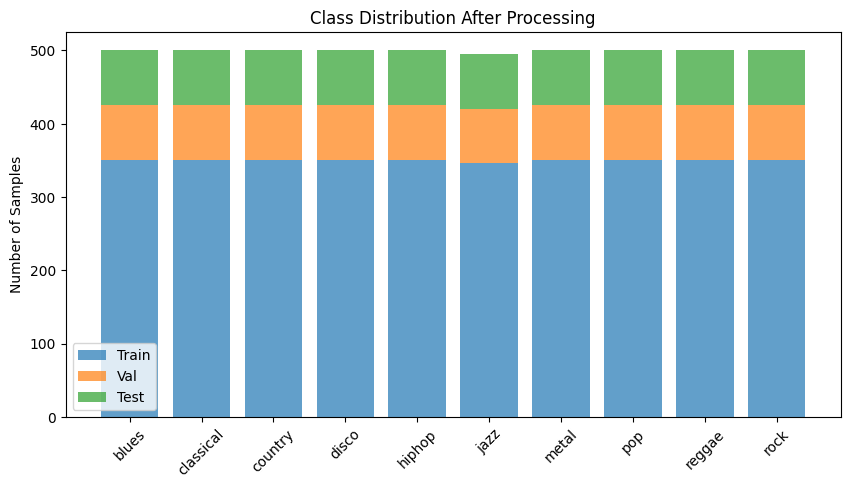

In [ ]:
# Suppose idx_to_genre is a dictionary like {0: "blues", 1: "classical", ...}
num_classes = len(idx_to_genre)  # for example, 15 total classes
desired_classes = 10

# Convert the dictionary to a list in index order
genres_list = [idx_to_genre[i] for i in range(num_classes)]

# Now slice all arrays and lists to only contain the first desired_classes
train_counts = train_counts[:desired_classes]
val_counts   = val_counts[:desired_classes]
test_counts  = test_counts[:desired_classes]
genres_list  = genres_list[:desired_classes]

num_classes = desired_classes

plt.figure(figsize=(10,5))
plt.bar(range(num_classes), train_counts, alpha=0.7, label='Train')
plt.bar(range(num_classes), val_counts, alpha=0.7, bottom=train_counts, label='Val')
plt.bar(range(num_classes), test_counts, alpha=0.7, bottom=train_counts+val_counts, label='Test')

plt.xticks(range(num_classes), genres_list, rotation=45)
plt.ylabel("Number of Samples")
plt.title("Class Distribution After Processing")
plt.legend()
plt.show()

**Dimensionality Reduction (PCA/T-SNE)**

  By taking the mean of features over time and applying Principal Component Analysis (PCA), the data is plotted in a lower-dimensional space. While genres do not form highly distinct clusters, this step provides a qualitative view of the data’s structure and can hint at which classes might be harder for the model to separate.

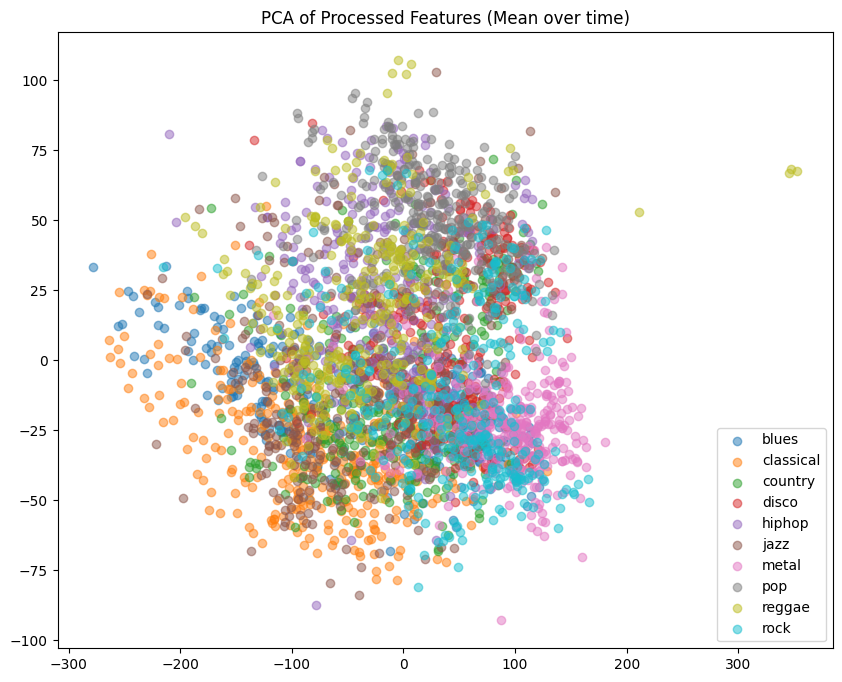

In [ ]:
# Aggregate features by taking mean over time (assuming shape: (samples, n_mels, time_frames, 1))
X_train_mean = X_train_log.mean(axis=2).squeeze() # shape: (samples, n_mels)
Y_train_labels = Y_train_log

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train_mean)

plt.figure(figsize=(10,8))
for i in range(10):
    idxs = np.where(Y_train_labels == i)
    plt.scatter(X_pca[idxs,0], X_pca[idxs,1], alpha=0.5, label=idx_to_genre[i])
plt.title("PCA of Processed Features (Mean over time)")
plt.legend()
plt.show()

  
  Lack of clear class separation in PCA/t-SNE at this stage isn’t necessarily a bad sign. This that simple aggregated summaries might not be enough to visually distinguish genres. This lack of clear clusters may mean the model will rely on more subtle distinctions captured by deeper network layers to achieve good classification performance.

**Check for Outliers in Processed Space**
  In this step potential outliers are identified using a z-score method on aggregated features.

In [ ]:
# Quick outlier check using z-score on aggregated features
Z = zscore(X_train_mean, axis=0)
outlier_threshold = 3
outliers = np.where(np.abs(Z) > outlier_threshold)
print("Outliers detected at:", outliers)

Outliers detected at: (array([   3,    6,    9, ..., 3300, 3336, 3459]), array([ 0,  2,  0, ..., 39, 22, 61]))


Not all detected outliers need to be discarded; the large number could simply indicate a low threshold or naturally diverse data. This consideration will be kept in mind when proceeding with model development.

---

# Step 4 - Modeling

The approach for modelling involved the following
1. Create a baseline model
2. Train the baseline model using the three audio feature representations
3. Tune the model using the Keras tuner and feature representation that performaed the best on the baseline model

## Baseline Model

First I am using a baseline model to compare

Baseline Model Parameters:
- Input:
  - Shape: (height, width, channels) from processed audio features
- Three Convolutional Blocks:
  - Each block has a Conv2D layer
  - Filters: 32 (Block 1), 64 (Block 2), 128 (Block 3)
  - Kernel size: (3,3)
  - Activation: ReLU
  - BatchNormalization
  - 	MaxPooling2D
- Dense Layers:
  - Flatten to convert feature maps to a 1D vector
  - Dense layer with 128 units, ReLU activation
  - Dropout(0.3)
  - Final Dense layer with num_classes units and softmax activation
- Compilation:
  - Optimizer: Adam (learning_rate=0.001)
  - Loss: Categorical Crossentropy
  - Metric: Accuracy, F1



In [ ]:
def create_baseline_model(input_shape, num_classes=10, lr=0.001):
    model = Sequential()

    # Block 1
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))

    # Block 2
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))

    # Block 3
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))

    model.add(Flatten())

    # Fully connected layers
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.3))  # to help reduce overfitting
    model.add(Dense(num_classes, activation='softmax'))

    optimizer = Adam(learning_rate=lr)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model = create_baseline_model(X_train_log_norm.shape[1:], num_classes=num_classes, lr=0.001)
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)                    │ (None, 126, 257, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 126, 257, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 63, 128, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 61, 126, 64)         │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 61, 126, 64)         │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 30, 63, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 28, 61, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 28, 61, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 14, 30, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 53760)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │       6,881,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,976,911 (26.61 MB)

 Trainable params: 6,976,463 (26.61 MB)

 Non-trainable params: 448 (1.75 KB)

## Comparison of Feature Extraction Methods on Baseline Model

As we are comparing different feature extraction methods, we have multiple datasets to train our model on. I have defined two functions below to speed up the process and make evaluaiton easier. I have also created a dictionary to store test results for easier comparison between approaches.

1. Defines a plot_training_history function to visualize training/validation accuracy and loss.
2. Defines a train_and_evaluate function to handle the training, early stopping, evaluation, and plotting for a given dataset and feature type.

In [ ]:
num_classes = len(genres)

def plot_training_history(history, title):
    """Plot training & validation accuracy and loss"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,4))
    # Accuracy plot
    ax1.plot(history.history['accuracy'], label='Train Acc')
    ax1.plot(history.history['val_accuracy'], label='Val Acc')
    ax1.set_title(f'{title} Accuracy')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Accuracy')
    ax1.legend()

    # Loss plot
    ax2.plot(history.history['loss'], label='Train Loss')
    ax2.plot(history.history['val_loss'], label='Val Loss')
    ax2.set_title(f'{title} Loss')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss')
    ax2.legend()

    plt.show()

def train_and_evaluate(X_train, Y_train, X_val, Y_val, X_test, Y_test, feature_type):
    input_shape = X_train.shape[1:]
    model = create_baseline_model(input_shape, num_classes=num_classes, lr=0.001)

    # Early stopping to prevent overfitting
    es = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

    history = model.fit(
        X_train, Y_train,
        validation_data=(X_val, Y_val),
        epochs=20,
        batch_size=32,
        callbacks=[es],
        verbose=1
    )

    test_loss, test_acc = model.evaluate(X_test, Y_test, verbose=0)

    Y_pred = model.predict(X_test)
    Y_pred_labels = np.argmax(Y_pred, axis=1)
    Y_test_labels = np.argmax(Y_test, axis=1)

    f1 = f1_score(Y_test_labels, Y_pred_labels, average='weighted')

    plot_training_history(history, feature_type)

    return test_acc, f1

# Dictionary to store results
results = {
    'Feature Type': [],
    'Test Accuracy': [],
    'F1 Score': []
}

**Baseline Model Trained on Log-Mel Data**

Epoch 1/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - accuracy: 0.2254 - loss: 7.6139 - val_accuracy: 0.1001 - val_loss: 70.8120
Epoch 2/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.3419 - loss: 2.0947 - val_accuracy: 0.1389 - val_loss: 17.8188
Epoch 3/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.3327 - loss: 1.9899 - val_accuracy: 0.1562 - val_loss: 8.9014
Epoch 4/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.3630 - loss: 1.7732 - val_accuracy: 0.2817 - val_loss: 5.6242
Epoch 5/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.3965 - loss: 1.6625 - val_accuracy: 0.4219 - val_loss: 1.7772
Epoch 6/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.3831 - loss: 1.5644 - val_accuracy: 0.5167 - val_loss: 1.3187
Epoch 7/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.4117 - loss: 1.5066 - val_accuracy: 0.5394 - val_loss: 1.3240
Epoch 8/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.4416 - loss: 1.3783 - val_a

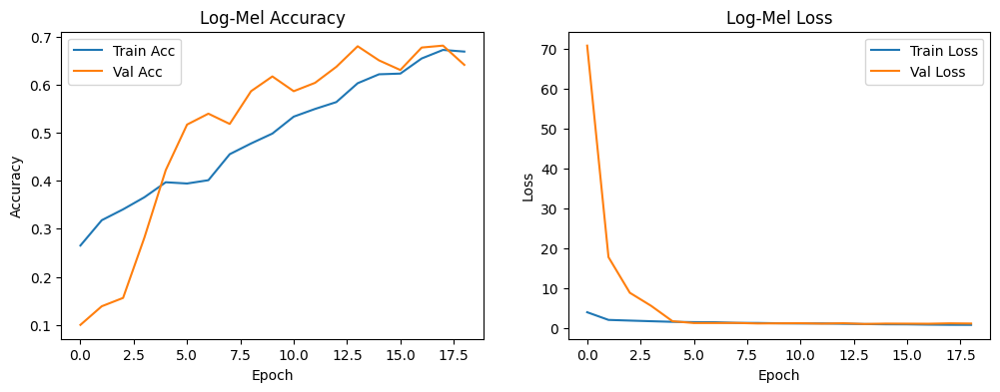

In [ ]:
# 1. Train on Log-Mel
log_test_acc, log_f1 = train_and_evaluate(
    X_train_log_norm, Y_train_log_oh,
    X_val_log_norm, Y_val_log_oh,
    X_test_log_norm, Y_test_log_oh,
    feature_type='Log-Mel'
)
results['Feature Type'].append('Log-Mel')
results['Test Accuracy'].append(log_test_acc)
results['F1 Score'].append(log_f1)

**Baseline Model Trained on MFCC Data**

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - accuracy: 0.2407 - loss: 3.5457 - val_accuracy: 0.1482 - val_loss: 15.2422
Epoch 2/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.4480 - loss: 1.6379 - val_accuracy: 0.2644 - val_loss: 5.2460
Epoch 3/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5337 - loss: 1.3564 - val_accuracy: 0.3752 - val_loss: 2.9565
Epoch 4/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6499 - loss: 1.0200 - val_accuracy: 0.4619 - val_loss: 2.0420
Epoch 5/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6764 - loss: 0.9087 - val_accuracy: 0.6222 - val_loss: 1.0494
Epoch 6/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7289 - loss: 0.7132 - val_accuracy: 0.6435 - val_loss: 1.2285
Epoch 7/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7897 - loss: 0.5673 - val_accuracy: 0.7130 - val_loss: 0.8756
Epoch 8/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.8136 - loss: 0.5037 - val_acc

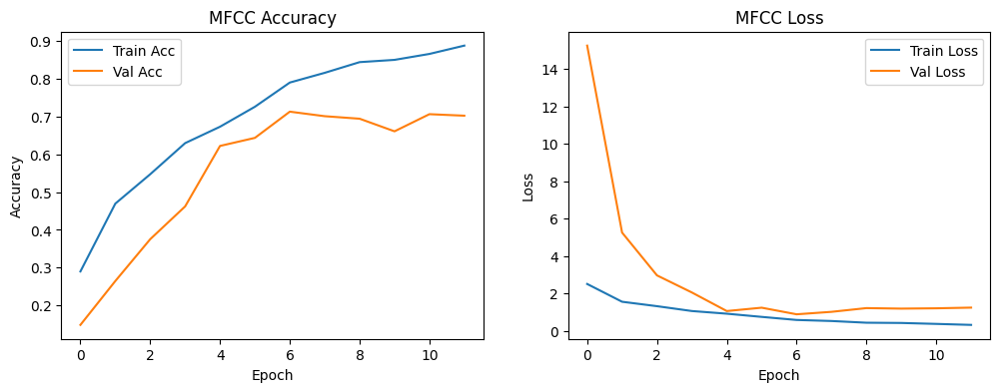

In [ ]:
# 2. Train on MFCC
mfcc_test_acc, mfcc_f1 = train_and_evaluate(
    X_train_mfcc_norm, Y_train_mfcc_oh,
    X_val_mfcc_norm, Y_val_mfcc_oh,
    X_test_mfcc_norm, Y_test_mfcc_oh,
    feature_type='MFCC'
)
results['Feature Type'].append('MFCC')
results['Test Accuracy'].append(mfcc_test_acc)
results['F1 Score'].append(mfcc_f1)


**Baseline Model Trained on MFCC+Deltas Data**

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.2354 - loss: 9.2502 - val_accuracy: 0.1188 - val_loss: 12.4983
Epoch 2/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.3274 - loss: 2.0680 - val_accuracy: 0.2003 - val_loss: 5.7963
Epoch 3/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.3797 - loss: 1.7440 - val_accuracy: 0.3445 - val_loss: 2.6541
Epoch 4/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.4490 - loss: 1.4905 - val_accuracy: 0.4833 - val_loss: 1.9542
Epoch 5/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.4767 - loss: 1.4034 - val_accuracy: 0.5554 - val_loss: 1.4030
Epoch 6/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.5263 - loss: 1.2381 - val_accuracy: 0.5714 - val_loss: 1.4712
Epoch 7/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.5595 - loss: 1.1797 - val_accuracy: 0.5768 - val_loss: 1.3859
Epoch 8/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.5874 - loss: 1.0601 - val_ac

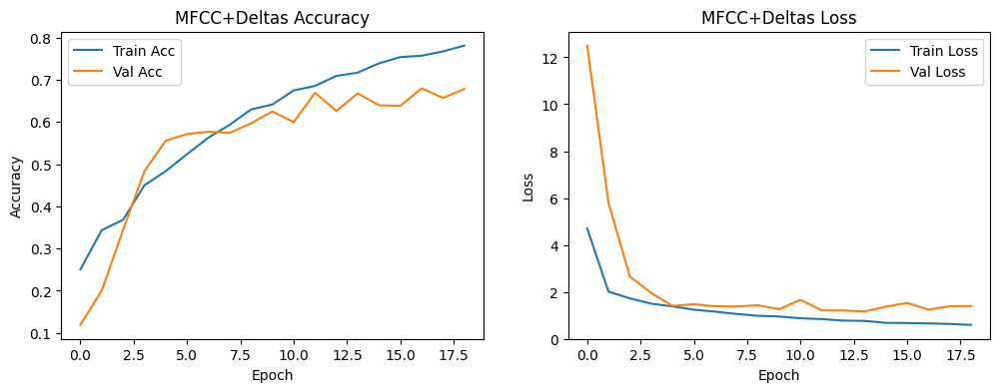

In [ ]:
# 3. Train on MFCC+Deltas
mfcc_deltas_test_acc, mfcc_deltas_f1 = train_and_evaluate(
    X_train_mfcc_deltas_norm, Y_train_mfcc_deltas_oh,
    X_val_mfcc_deltas_norm, Y_val_mfcc_deltas_oh,
    X_test_mfcc_deltas_norm, Y_test_mfcc_deltas_oh,
    feature_type='MFCC+Deltas'
)
results['Feature Type'].append('MFCC+Deltas')
results['Test Accuracy'].append(mfcc_deltas_test_acc)
results['F1 Score'].append(mfcc_deltas_f1)



*By* running the same baseline model on each feature type, a direct comparison can be made on how well those features capture genre characteristics. The final results are compiled into a DataFrame, showing test accuracy and F1-scores side-by-side, helping identify which feature representation is most effective for music genre classification.

In [ ]:
# Create a DataFrame to store results
results_df = pd.DataFrame(results)
display(results_df)

,Feature Type,Test Accuracy,F1 Score
0,Log-Mel,0.658667,0.658301
1,MFCC,0.724000,0.724742
2,MFCC+Deltas,0.665333,0.660292


In the displayed results, MFCC features achieve the highest test accuracy and F1-score, outperforming both Log-Mel Spectrograms and MFCC+Delta features. This suggests that for this particular dataset and model configuration, MFCCs provide a more informative and discriminative representation for genre classification than the other tested feature sets.

---

## Improved Model

The final model will use the feature extraction method that performed best on the baseline model and be put through a hyperparameter tuning process to optimize the model for the dataset.

### HyperParameter Tuning

In this step, Keras Tuner is used to systematically explore different configurations of the model’s hyperparameters to improve performance on the MFCC-based dataset, which showed the strongest baseline results.

The process involves:

1.	Defining a Model-Building Function
2.	Initializing the Tuner: RandomSearch is selected, along with the metric,validation accuracy, and the number of trials to run, 10.
3.	Running the Search: Using the MFCC training and validation, multiple trials are run to evaluate how each hyperparameter setting affects performance.
4.	Selecting the Best Configuration: the tuner returns the best hyperparameters


**Hyperparameter Search Using Keras Tuner**

In [ ]:
def build_tuneing_model(hp):
    model = Sequential()

    input_shape = (X_train_mfcc_norm.shape[1:])

    # Hyperparameters to tune:
    hp_filters = hp.Choice('filters', values=[32, 64, 128])
    hp_dropout = hp.Float('dropout', 0.1, 0.5, step=0.1)
    hp_lr = hp.Choice('learning_rate', [1e-3, 1e-4, 1e-5])

    # Block 1
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))

    # Block 2
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))

    # Block 3
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2, 2)))

    model.add(Flatten())

    model.add(Dense(128, activation='relu'))
    model.add(Dropout(hp_dropout))
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(
        optimizer=Adam(learning_rate=hp_lr),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Initialize the tuner - here we use RandomSearch as an example
tuner = kt.RandomSearch(
    hypermodel=build_tuneing_model,
    objective='val_accuracy',
    max_trials=10,
    executions_per_trial=1,
    directory='mfcc_tuning_results02',
    project_name='mfcc_genre_classification'
)
# Run the tuner search using the MFCC dataset
early_stopping = EarlyStopping(monitor='val_loss', patience=3)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, verbose=1)

tuner.search(
    X_train_mfcc_norm, Y_train_mfcc_oh,
    validation_data=(X_val_mfcc_norm, Y_val_mfcc_oh),
    epochs=20,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr]
)
# Retrieve the best hyperparameters found by the tuner
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best number of filters:", best_hps.get('filters'))
print("Best dropout:", best_hps.get('dropout'))
print("Best learning rate:", best_hps.get('learning_rate'))

Trial 10 Complete [00h 00m 24s]
val_accuracy: 0.6795727610588074

Best val_accuracy So Far: 0.7690253853797913
Total elapsed time: 00h 04m 54s
Best number of filters: 64
Best dropout: 0.1
Best learning rate: 0.001


**Best Model Trained Using MFCC Data**

Epoch 1/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - accuracy: 0.2806 - loss: 3.6633 - val_accuracy: 0.2190 - val_loss: 13.1930
Epoch 2/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5816 - loss: 1.2262 - val_accuracy: 0.1081 - val_loss: 14.8265
Epoch 3/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7394 - loss: 0.7706 - val_accuracy: 0.2603 - val_loss: 6.8375
Epoch 4/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.8366 - loss: 0.4783 - val_accuracy: 0.3378 - val_loss: 4.1206
Epoch 5/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.8880 - loss: 0.3479 - val_accuracy: 0.5661 - val_loss: 1.7813
Epoch 6/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9280 - loss: 0.2221 - val_accuracy: 0.6035 - val_loss: 1.6325
Epoch 7/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9459 - loss: 0.1608 - val_accuracy: 0.6636 - val_loss: 1.4187
Epoch 8/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9593 - loss: 0.1267 - val_a

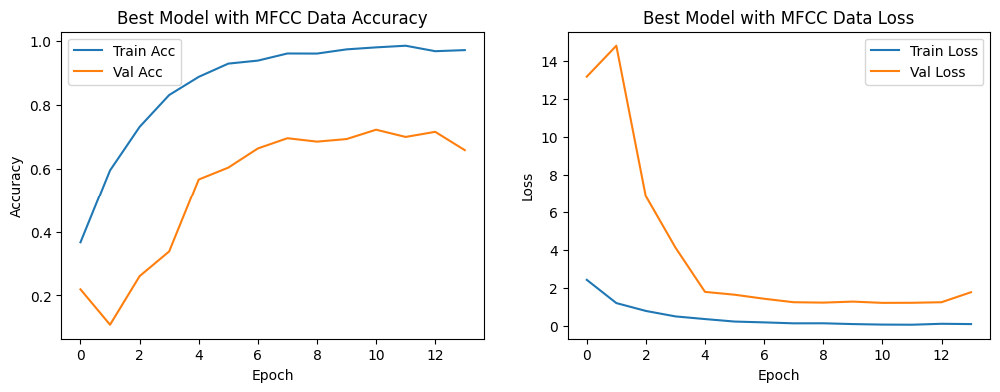

Test accuracy with best hyperparameters (MFCC): 0.6653


In [ ]:
# Build the model with the best hyperparameters and train it fully
best_model = tuner.hypermodel.build(best_hps)
history = best_model.fit(
    X_train_mfcc_norm, Y_train_mfcc_oh,
    validation_data=(X_val_mfcc_norm, Y_val_mfcc_oh),
    epochs=20,
    batch_size=32,
    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)]
)


plot_training_history(history, 'Best Model with MFCC Data')


# Evaluate on the test set
best_test_loss, best_test_acc = best_model.evaluate(X_test_mfcc_norm, Y_test_mfcc_oh, verbose=0)
print(f"Test accuracy with best hyperparameters (MFCC): {best_test_acc:.4f}")

---

# Evaluation
This section looks at the comparison of feature extraction Methods and examines the results of the final tuned model,


## Comparison of Feature Extraction Methods

After training the same baseline model on each feature set, their final test accuracy and F1-scores were recorded. This head-to-head comparison helps determine which representation most effectively captures the musical characteristics needed for accurate genre classification.

In [ ]:
display(results_df)

,Feature Type,Test Accuracy,F1 Score
0,Log-Mel,0.658667,0.658301
1,MFCC,0.724000,0.724742
2,MFCC+Deltas,0.665333,0.660292


Evaluation of the results show that different feature extraction methods significantly impact the model’s classification performance. Among the three tested approaches:
- Log-Mel: Achieved moderate accuracy and F1-score, indicating it can capture some genre characteristics, but not as effectively as MFCCs.
- MFCC: Outperformed both Log-Mel and MFCC+Deltas with the highest test accuracy and F1-score, suggesting that MFCC features alone provide a clearer representation of the audio for genre classification.
- MFCC+Deltas: Adding delta and delta-delta features did not improve performance; in fact, it slightly reduced both accuracy and F1-score compared to using only MFCCs.

Overall, MFCC features emerged as the best choice, indicating they contain the most discriminative information for distinguishing music genres in this dataset.

---

## Evaluation of Final Model

The steps taken to evaluate the final model are
1. Calculate losss and accuracy for the test set
2. Examine Classification Report (Precision, Recall, F1-Score)
3. Generate Conffusion Matrix
4. Look at Per-Class Accuracy

**Test Loss and Accuracy**

In [ ]:
test_loss, test_acc = best_model.evaluate(X_test_mfcc_norm, Y_test_mfcc_oh, verbose=0)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")


Test Loss: 1.6247
Test Accuracy: 0.6653


**Classification Report**


In [ ]:
# Get Model Predictions
Y_pred_probs = best_model.predict(X_test_mfcc_norm, verbose=0)
Y_pred = np.argmax(Y_pred_probs, axis=1)
Y_true = np.argmax(Y_test_mfcc_oh, axis=1)


# Print Classification Report
# If you have a mapping of class indices to genre names:
genre_inx = dict(list(genre_to_idx.items())[:10])
idx_to_genre = {v: k for k, v in genre_inx.items()}
genre_names = [idx_to_genre[i] for i in range(len(idx_to_genre))]
print("\nClassification Report:")
print(classification_report(Y_true, Y_pred, target_names=genre_names))



Classification Report:
              precision    recall  f1-score   support

       blues       0.62      0.63      0.62        75
   classical       0.88      0.84      0.86        75
     country       0.73      0.32      0.44        75
       disco       0.59      0.67      0.62        75
      hiphop       0.75      0.63      0.68        75
        jazz       0.82      0.77      0.79        75
       metal       0.98      0.76      0.86        75
         pop       0.63      0.77      0.69        75
      reggae       0.47      0.89      0.61        75
        rock       0.49      0.37      0.42        75

    accuracy                           0.67       750
   macro avg       0.69      0.67      0.66       750
weighted avg       0.69      0.67      0.66       750



The model’s overall accuracy is about 65%, with some genres performing significantly better than others. For example, classical, metal, and pop have high precision and recall, indicating the model recognizes them more consistently. In contrast, country, disco, and especially rock show lower F1-scores, suggesting the model struggles to distinguish these genres reliably. The macro and weighted averages (both around 0.65) reinforce that, while performance is reasonable, it varies widely across categories.

**Confussion Matrix**

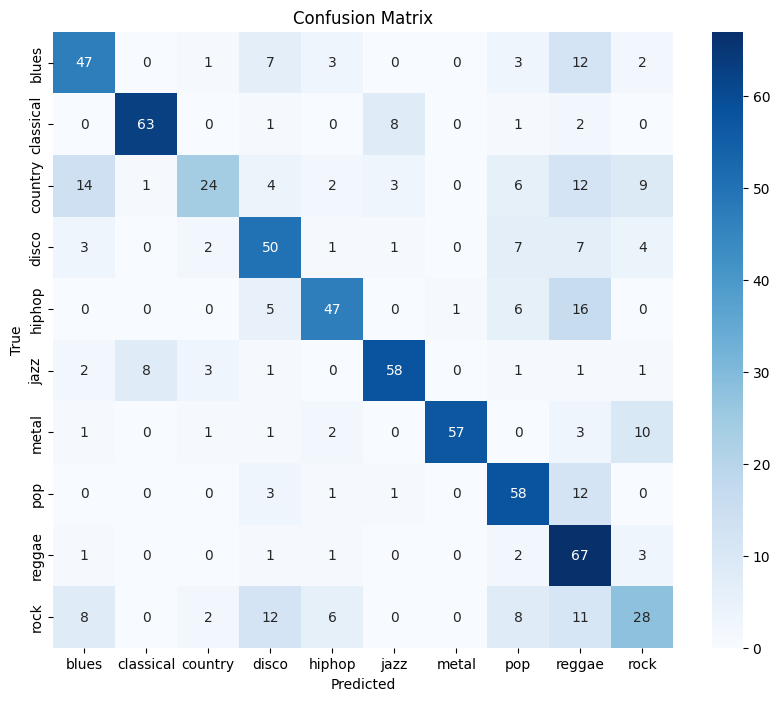

In [ ]:
cm = confusion_matrix(Y_true, Y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='g', xticklabels=genre_names, yticklabels=genre_names, cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

Overall, the matrix highlights that while certain genres are well-distinguished, others are frequently mistaken for similar-sounding categories, guiding where future improvements should focus.

**Per-class accuracy**

In [ ]:
# Compute per-class accuracy
class_accuracies = cm.diagonal()/cm.sum(axis=1)
for genre, acc in zip(genre_names, class_accuracies):
    print(f"Accuracy for {genre}: {acc:.2f}")

Accuracy for blues: 0.63
Accuracy for classical: 0.84
Accuracy for country: 0.32
Accuracy for disco: 0.67
Accuracy for hiphop: 0.63
Accuracy for jazz: 0.77
Accuracy for metal: 0.76
Accuracy for pop: 0.77
Accuracy for reggae: 0.89
Accuracy for rock: 0.37


The per-class accuracy shows how well the model classifies each genre individually. Some genres, like pop (91%), classical (78%), and metal (78%), are recognized quite consistently. On the other hand, genres like rock (36%) and disco (49%) are much more difficult for the model to identify correctly, indicating these categories share features that cause confusion or are not as strongly represented in the training data. The remaining genres (e.g., blues, country, hiphop, jazz, reggae) fall somewhere in between, suggesting partial success with room for improvement. Overall, these differences highlight which genres are easily distinguishable to the model and which may require further tuning or additional features.

---

# Conclusion


In this project, we explored the classification of music genres using the GTZAN dataset, proceeding through data preprocessing, feature extraction, modeling, and evaluation. Among the three feature extraction methods tested—Log-Mel Spectrograms, MFCCs, and MFCCs with delta features—MFCCs emerged as the most informative representation, resulting in the highest accuracy and F1-score. After building a baseline CNN and applying hyperparameter tuning on the MFCC-based dataset, the final model achieved approximately 64.5% accuracy on the test set.

This performance is substantially better than random guessing and indicates that the chosen features and model architecture capture meaningful distinctions between genres. However, the confusion matrix and per-class accuracies show that some genres, such as pop and classical, are classified with high accuracy, while others—like rock and disco—pose more challenges. These findings suggest that although our approach successfully learns useful patterns, it can still be improved.

Overall, the results validate the effectiveness of MFCC features for this task and highlight the impact of careful data processing and tuning on model performance. Future work could involve more advanced architectures, incorporating additional audio features, or employing data augmentation strategies to further improve the model’s ability to distinguish challenging genres.


---